In [1]:
# Install Libraries (Install if needed)
!apt-get install -y tesseract-ocr
!pip install pytesseract
!pip install torch torchvision transformers tqdm
!pip install tqdm
!pip install tensorflow matplotlib opencv-python-headless
!pip install easyocr
!pip install detectron2
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'
!pip install pyarrow
!pip install fastparquet
!pip install datasets
!pip install evaluate
!pip install jiwer

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (5,361 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 123630 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-

In [2]:

import os
# --- MOUNT GOOGLE DRIVE ---
from google.colab import drive

print("Mounting Google Drive...")
drive.mount('/content/drive')

google_drive_path = "/content/drive/My Drive/AAI-521-Computer Vision Dataset/"
print("Available files:", os.listdir(google_drive_path))

Mounting Google Drive...
Mounted at /content/drive
Available files: ['TextOCR Dataset.zip', 'TextOCR Dataset.zip (Unzipped Files)', 'TextOCR_test_Images_filtered.zip', 'Model_TcOCR_Final.ipynb', 'Model_TcOCR_Final.pdf', 'preprocessed_images.zip']


In [3]:
# Correct path to the dataset


import os
from zipfile import ZipFile
from tqdm import tqdm

google_drive_zip_path = "/content/drive/My Drive/AAI-521-Computer Vision Dataset/TextOCR Dataset.zip"
unzipped_folder = "/content/unzipped_dataset"


def unzip_dataset(zip_path, extract_to):
    if os.path.exists(zip_path):
        print(f"Extracting dataset from {zip_path}...")



        # Open the zip file
        with ZipFile(zip_path, 'r') as zip_ref:
            # Get the list of files to extract
            file_list = zip_ref.namelist()

            # Create a progress bar for extraction
            for file in tqdm(file_list, desc="Extracting", unit="file"):
                zip_ref.extract(file, extract_to)

        print(f"Dataset extracted to {extract_to}")
    else:
        raise FileNotFoundError(f"Zip file not found at {zip_path}")


# Unzip the dataset with progress bar
unzip_dataset(google_drive_zip_path, unzipped_folder)

# List the unzipped dataset
print("\n----- Top Level Files -----")
!ls /content/unzipped_dataset

# Optionally, find all directories within the unzipped dataset
print("\n----- Dataset Directory -----")
!find /content/unzipped_dataset -type d

Extracting dataset from /content/drive/My Drive/AAI-521-Computer Vision Dataset/TextOCR Dataset.zip...


Extracting: 100%|██████████| 25124/25124 [02:06<00:00, 198.11file/s]


Dataset extracted to /content/unzipped_dataset

----- Top Level Files -----
annot.csv  annot.parquet  img.csv  img.parquet	TextOCR_0.1_train.json	train_val_images

----- Dataset Directory -----
/content/unzipped_dataset
/content/unzipped_dataset/train_val_images
/content/unzipped_dataset/train_val_images/train_images


In [ ]:
# ~~~~~ Top Level Files ~~~~~ Data Sample
# Correct paths to dataset files and folders
base_path = "/content/unzipped_dataset"
csv_files = [os.path.join(base_path, "annot.csv"), os.path.join(base_path, "img.csv")]
parquet_files = [os.path.join(base_path, "annot.parquet"), os.path.join(base_path, "img.parquet")]
json_file = os.path.join(base_path, "TextOCR_0.1_train.json")
image_folder = os.path.join(base_path, "train_val_images/train_images")



Displaying the first 20 images from the dataset...


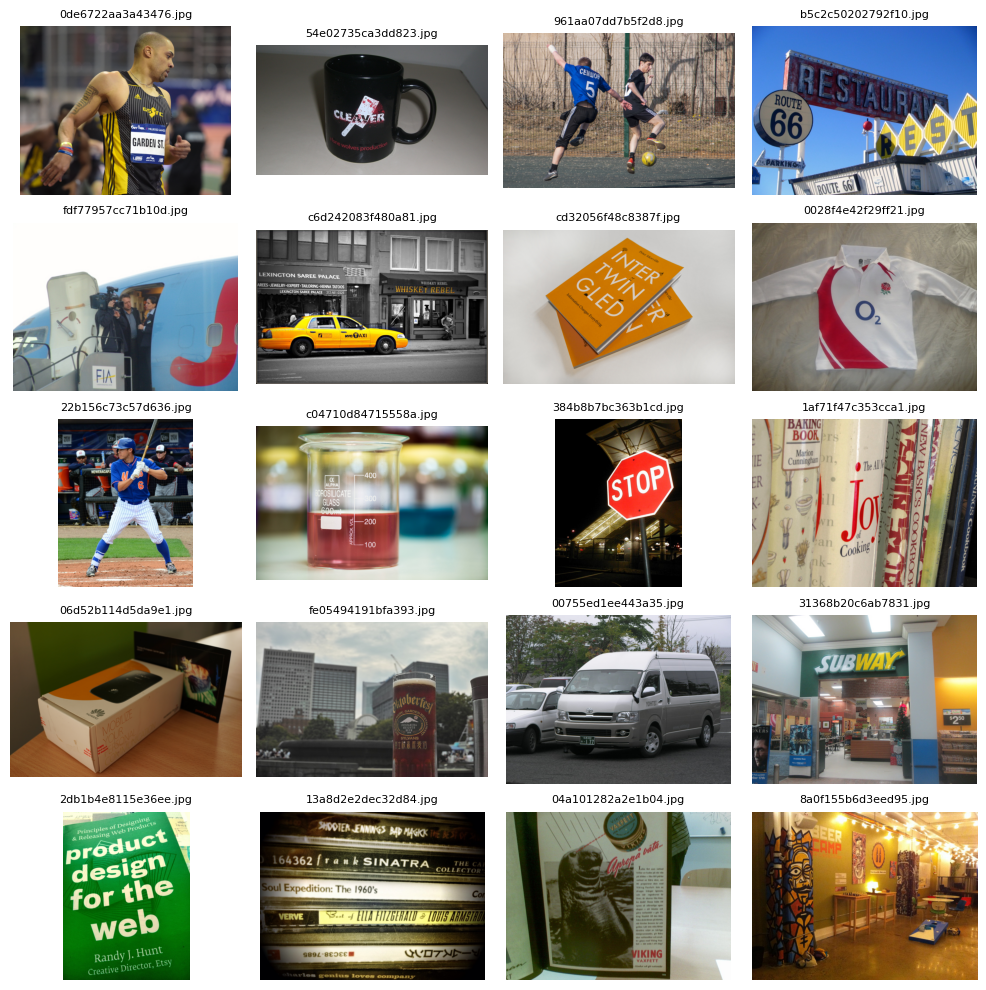

In [ ]:
import matplotlib.pyplot as plt  # Ensure this is imported
import os
import cv2  # Ensure this is imported


# Update the folder path to the correct image directory
unzipped_folder = "/content/unzipped_dataset/train_val_images/train_images"


def display_sample_images(folder, num_images=20):
    valid_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.tiff')
    image_files = [f for f in os.listdir(folder) if f.lower().endswith(valid_extensions)]
    image_files = image_files[:num_images]  # Limit to the first `num_images`

    if not image_files:
        print("No images found in the folder.")
        return

    # Display images in a grid
    plt.figure(figsize=(10, 10))
    for i, image_name in enumerate(image_files, start=1):
        image_path = os.path.join(folder, image_name)
        image = cv2.imread(image_path)
        if image is not None:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for display
            plt.subplot(5, 4, i)  # Create a grid of 5 rows and 4 columns
            plt.imshow(image)
            plt.title(image_name, fontsize=8)
            plt.axis('off')
        else:
            print(f"Unable to read image: {image_name}")
    plt.tight_layout()
    plt.show()


# Display the first 20 images
print("Displaying the first 20 images from the dataset...")
display_sample_images(unzipped_folder)

Processing Images: 100%|██████████| 25119/25119 [1:01:17<00:00,  6.83image/s]



Total images processed: 25119
Total OCR-ready images saved in '/content/test_images': 21266
Total non-OCR-ready images saved in '/content/disposed_images': 3853
Visualizing first 10 OCR-ready images from /content/test_images...


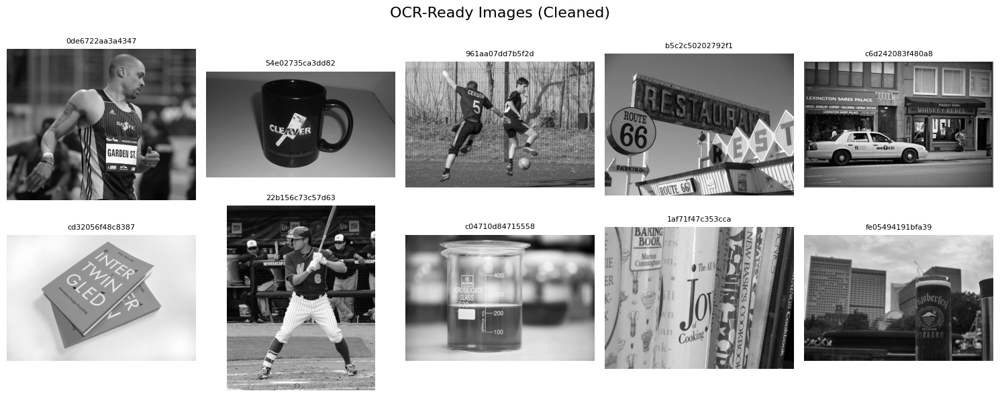

Visualizing first 10 non-OCR-ready images from /content/disposed_images...


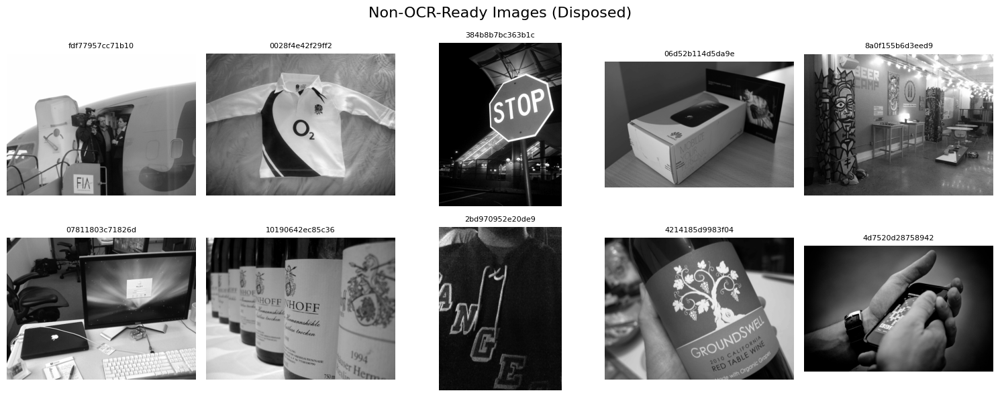

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image, ImageStat  # Import Image and ImageStat
import pytesseract
from shutil import copyfile

# Thresholds for quality checks
BRIGHTNESS_THRESHOLD = 50
CONTRAST_THRESHOLD = 20
SHARPNESS_THRESHOLD = 100

# Paths for input and output folders
input_folder = "/content/unzipped_dataset/train_val_images/train_images"
ocr_ready_folder = "/content/test_images"  # Folder for OCR-ready images
non_ocr_ready_folder = "/content/disposed_images"  # Folder for non-OCR-ready images
os.makedirs(ocr_ready_folder, exist_ok=True)  # Ensure OCR-ready folder exists
os.makedirs(non_ocr_ready_folder, exist_ok=True)  # Ensure non-OCR-ready folder exists

# Functions for image quality evaluation
def calculate_brightness(image):
    """Calculate brightness of an image."""
    pil_image = Image.fromarray(image)
    stat = ImageStat.Stat(pil_image)
    return stat.mean[0]

def calculate_contrast(image):
    """Calculate contrast of an image."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return gray.std()

def calculate_sharpness(image):
    """Calculate sharpness of an image."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var()

def contains_text(image_path):
    """Check if an image contains text using Tesseract OCR."""
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    text = pytesseract.image_to_string(image)
    return len(text.strip()) > 0

# Function to clean and categorize images
def clean_images(input_folder, ocr_ready_folder, non_ocr_ready_folder):
    valid_images = []
    non_ocr_ready_images = []

    for image_name in tqdm(os.listdir(input_folder), desc="Processing Images", unit="image"):
        image_path = os.path.join(input_folder, image_name)
        if not image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
            continue

        # Read and evaluate the image
        image = cv2.imread(image_path)
        if image is None:
            continue  # Skip unreadable images

        try:
            # Calculate quality metrics
            brightness = calculate_brightness(image)
            contrast = calculate_contrast(image)
            sharpness = calculate_sharpness(image)

            # Check if the image meets OCR readiness criteria or contains text
            if (
                brightness >= BRIGHTNESS_THRESHOLD and
                contrast >= CONTRAST_THRESHOLD and
                sharpness >= SHARPNESS_THRESHOLD
            ) or contains_text(image_path):
                # Save OCR-ready image
                copyfile(image_path, os.path.join(ocr_ready_folder, image_name))
                valid_images.append(image_name)
            else:
                # Save non-OCR-ready image
                copyfile(image_path, os.path.join(non_ocr_ready_folder, image_name))
                non_ocr_ready_images.append(image_name)
        except Exception as e:
            print(f"Error processing {image_name}: {e}")

    return valid_images, non_ocr_ready_images

# Function to visualize images in a 2x5 grid
def visualize_images(folder, title, num_images=10):
    """Display images in a 2x5 grid."""
    files = os.listdir(folder)[:num_images]  # Get the first `num_images` files
    rows, cols = 2, 5  # Define grid dimensions
    plt.figure(figsize=(15, 6))
    for i, file in enumerate(files, 1):
        img_path = os.path.join(folder, file)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Load image in grayscale
        if img is not None:
            plt.subplot(rows, cols, i)
            plt.imshow(img, cmap='gray')
            plt.title(file[:15], fontsize=8)  # Truncate file names for readability
            plt.axis('off')
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Run the cleaning process
ocr_ready_images, non_ocr_ready_images = clean_images(input_folder, ocr_ready_folder, non_ocr_ready_folder)

# Summary of results
print(f"\nTotal images processed: {len(os.listdir(input_folder))}")
print(f"Total OCR-ready images saved in '{ocr_ready_folder}': {len(ocr_ready_images)}")
print(f"Total non-OCR-ready images saved in '{non_ocr_ready_folder}': {len(non_ocr_ready_images)}")

# Visualize OCR-ready images
print(f"Visualizing first 10 OCR-ready images from {ocr_ready_folder}...")
visualize_images(ocr_ready_folder, title="OCR-Ready Images (Cleaned)")

# Visualize Non-OCR-ready images
print(f"Visualizing first 10 non-OCR-ready images from {non_ocr_ready_folder}...")
visualize_images(non_ocr_ready_folder, title="Non-OCR-Ready Images (Disposed)")


Preprocessing images...


Preprocessing Images: 100%|██████████| 21266/21266 [22:32<00:00, 15.72image/s]


Preprocessing complete. Preprocessed images are saved in '/content/preprocessed_images'.
Displaying first 10 preprocessed images from /content/preprocessed_images...


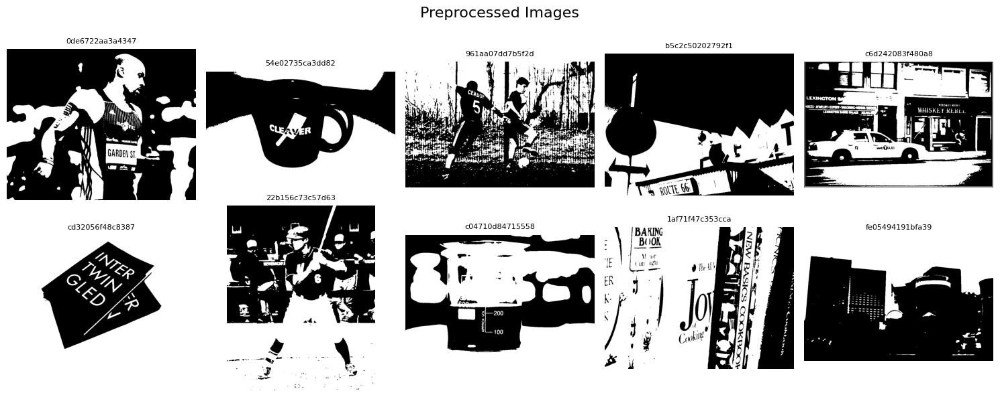

In [ ]:
import numpy as np
import os
import cv2  # Assuming you're using OpenCV


# Input folder for preprocessing (use OCR-ready folder from cleaning step)
input_folder = ocr_ready_folder  # OCR-ready folder from cleaning
output_folder = "/content/preprocessed_images"  # Folder for preprocessed images
os.makedirs(output_folder, exist_ok=True)  # Ensure preprocessed folder exists

def preprocess_image(image_path, output_path):
    """Preprocess the image by converting to grayscale, applying Gaussian blur, binarization, deskewing, and sharpening."""
    # Load the image
    image = cv2.imread(image_path)

    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian Blur for noise reduction
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Apply Otsu's Thresholding for binarization
    _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Deskew the image (limit angle correction to small deviations)
    coords = np.column_stack(np.where(binary > 0))
    angle = cv2.minAreaRect(coords)[-1]
    if angle < -45:
        angle = -(90 + angle)
    elif abs(angle) > 15:  # Prevent large rotations
        angle = 0
    else:
        angle = -angle

    # Rotate the image to deskew
    (h, w) = binary.shape[:2]
    center = (w // 2, h // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    deskewed = cv2.warpAffine(binary, rotation_matrix, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    # Sharpen the image
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    sharpened = cv2.filter2D(deskewed, -1, kernel)

    # Save the preprocessed image
    cv2.imwrite(output_path, sharpened)

# Get the list of image files with valid extensions
image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff'))]

# Preprocess each image
print("Preprocessing images...")
for filename in tqdm(image_files, desc="Preprocessing Images", unit="image"):
    input_path = os.path.join(input_folder, filename)
    output_path = os.path.join(output_folder, filename)
    preprocess_image(input_path, output_path)

print(f"Preprocessing complete. Preprocessed images are saved in '{output_folder}'.")

# Visualize Preprocessed Images
def visualize_images(folder, title, num_images=10):
    """Display images in a 2x5 grid."""
    files = os.listdir(folder)[:num_images]
    rows, cols = 2, 5  # Adjust grid dimensions
    plt.figure(figsize=(15, 6))
    for i, file in enumerate(files, 1):
        img_path = os.path.join(folder, file)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is not None:
            plt.subplot(rows, cols, i)
            plt.imshow(img, cmap='gray')
            plt.title(file[:15], fontsize=8)  # Truncate file names for readability
            plt.axis('off')
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Display 10 preprocessed images
print(f"Displaying first 10 preprocessed images from {output_folder}...")
visualize_images(output_folder, title="Preprocessed Images")

In [ ]:
import shutil

# Replace 'your_directory_name' with the directory you want to export
directory_to_export = '/content/preprocessed_images'
output_zip_file = 'preprocessed_images.zip'

# Compress the directory into a zip file
shutil.make_archive(output_zip_file.replace('.zip', ''), 'zip', directory_to_export)

# Provide a link to download the zip file
from google.colab import files
files.download(output_zip_file)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import json

# Load the annotation file (update the path to your actual annotation file)
annotation_path = '/content/unzipped_dataset/TextOCR_0.1_train.json'  # Replace with actual path
if not os.path.exists(annotation_path):
    raise FileNotFoundError(f"Annotation file not found: {annotation_path}")

with open(annotation_path, 'r') as f:
    data = json.load(f)

# Ensure `data` contains the expected keys
required_keys = ['imgs', 'anns', 'imgToAnns']
if not all(key in data for key in required_keys):
    raise KeyError(f"`data` is missing one or more required keys: {required_keys}")





import pandas as pd
# Prepare a dictionary to store file samples for visualization
file_samples = {}

# Load and collect CSV file samples
for file in csv_files:
    try:
        df = pd.read_csv(file)
        file_samples[file] = df.head()  # Collect first 5 rows
    except Exception as e:
        file_samples[file] = pd.DataFrame({"Error": [str(e)]})  # Collect error as DataFrame

# Load and collect Parquet file samples
for file in parquet_files:
    try:
        df = pd.read_parquet(file)
        file_samples[file] = df.head()  # Collect first 5 rows
    except Exception as e:
        file_samples[file] = pd.DataFrame({"Error": [str(e)]})  # Collect error as DataFrame

# Load and collect JSON file samples
try:
    with open(json_file, 'r') as f:
        data = json.load(f)
        # Convert first 5 keys and values to DataFrame
        json_sample = {k: data[k] for k in list(data.keys())[:5]}
        file_samples[json_file] = pd.DataFrame.from_dict(json_sample, orient='index', columns=['Value'])
except Exception as e:
    file_samples[json_file] = pd.DataFrame({"Error": [str(e)]})  # Collect error as DataFrame

# Load and collect image folder sample
try:
    image_sample = os.listdir(image_folder)[:5]
    file_samples[image_folder] = pd.DataFrame({"Images": image_sample})  # Convert filenames to DataFrame
except Exception as e:
    file_samples[image_folder] = pd.DataFrame({"Error": [str(e)]})  # Collect error as DataFrame

# Display DataFrame contents
for file_path, sample_df in file_samples.items():
    print(f"--- Sample from {file_path} ---")
    print(sample_df)

--- Sample from /content/unzipped_dataset/annot.csv ---
   Unnamed: 0                  id          image_id  \
0           0  a4ea732cd3d5948a_1  a4ea732cd3d5948a   
1           1  a4ea732cd3d5948a_2  a4ea732cd3d5948a   
2           2  a4ea732cd3d5948a_3  a4ea732cd3d5948a   
3           3  a4ea732cd3d5948a_4  a4ea732cd3d5948a   
4           4  a4ea732cd3d5948a_5  a4ea732cd3d5948a   

                            bbox  utf8_string  \
0   [525.83, 3.4, 197.64, 33.94]  Performance   
1  [534.67, 64.68, 91.22, 38.19]        Sport   
2  [626.95, 63.62, 96.52, 31.82]        Watch   
3  [577.4, 141.87, 147.13, 43.1]   ...period.   
4  [391.03, 163.9, 60.82, 38.65]            .   

                                              points     area  
0  [525.83, 3.4, 723.47, 7.29, 722.76, 36.99, 525...  6707.90  
1  [535.73, 64.68, 623.41, 67.51, 625.89, 102.87,...  3483.69  
2  [626.95, 63.62, 721.7, 63.62, 723.47, 95.44, 6...  3071.27  
3  [580.02, 143.61, 724.53, 141.87, 723.66, 184.9...  6341.30 

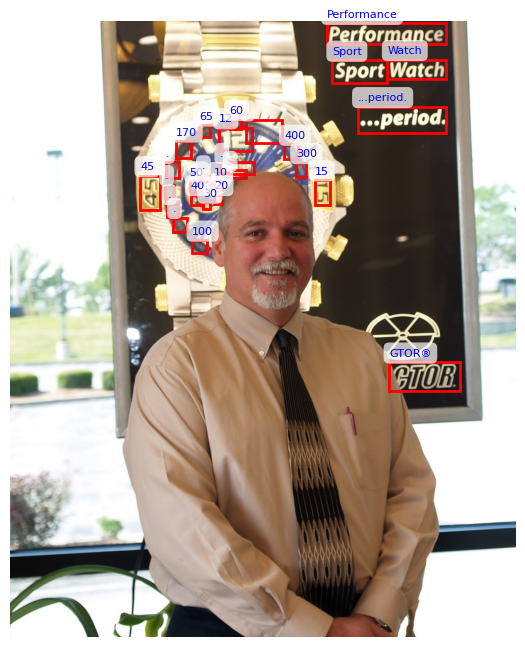

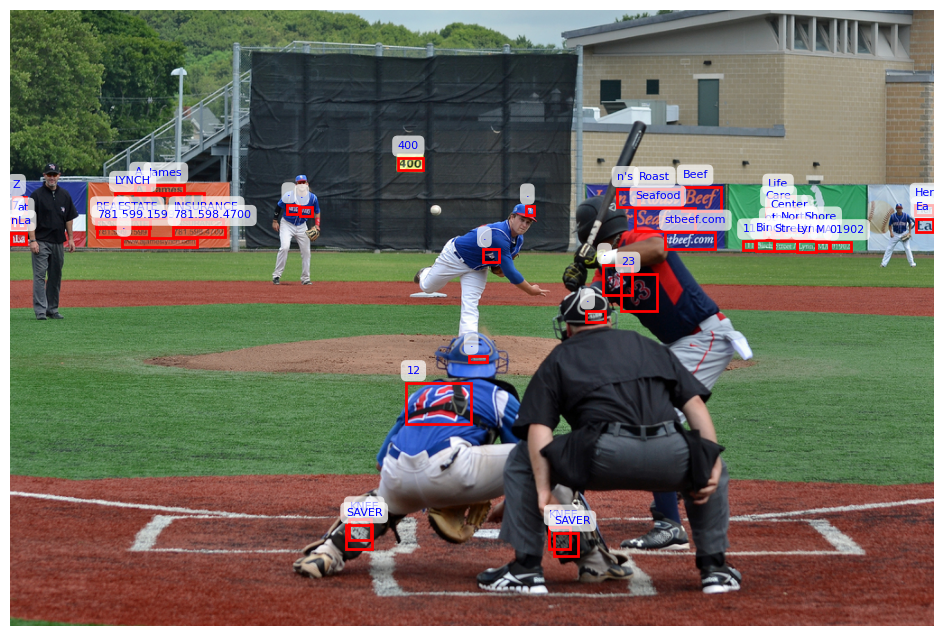

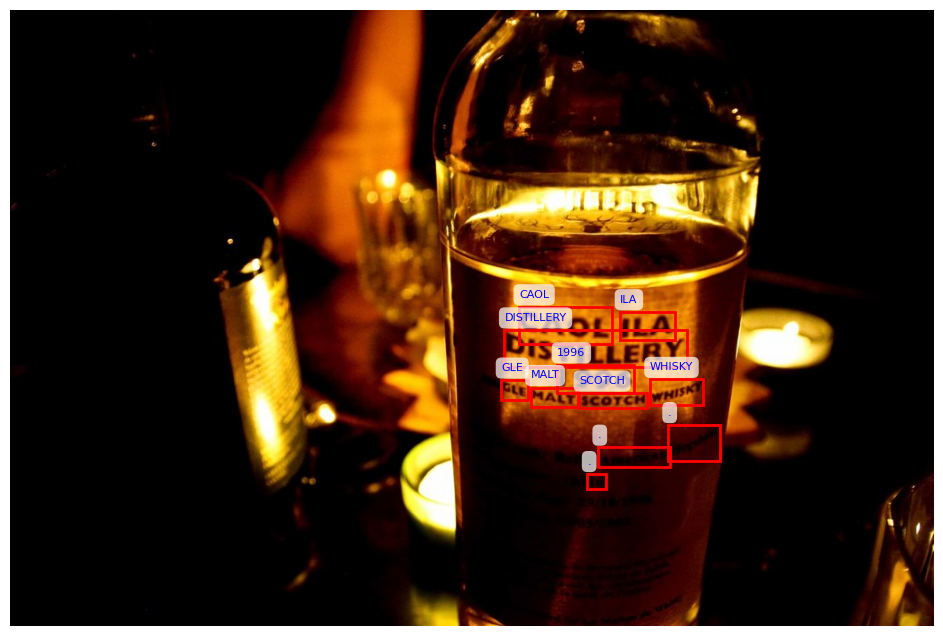

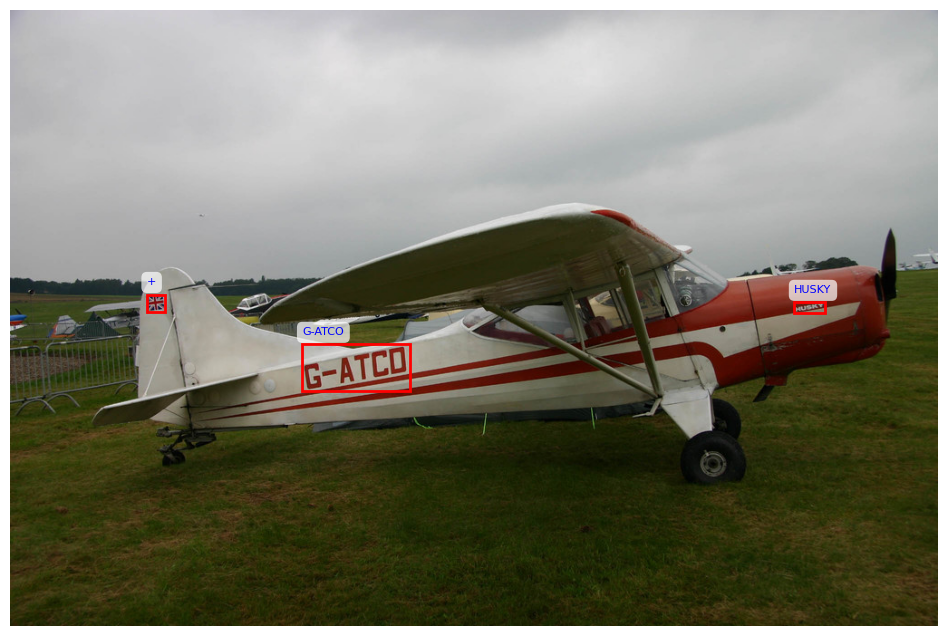

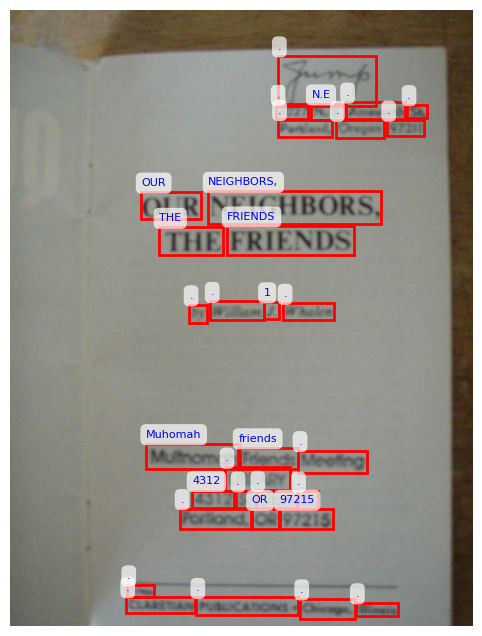

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Function to visualize annotations on images
def visualize_annotations(image_path, annotations):
    """
    Display image with bounding boxes and annotations.
    """
    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        return

    # Load the image using matplotlib
    image = plt.imread(image_path)

    # Create a figure and axis
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image)

    # Loop through the annotations and add bounding boxes and text
    for ann in annotations:
        bbox = ann['bbox']  # Bounding box: [x, y, width, height]
        text = ann['utf8_string']  # Text annotation

        # Create a rectangle for the bounding box
        rect = patches.Rectangle(
            (bbox[0], bbox[1]), bbox[2], bbox[3],
            linewidth=2, edgecolor="red", facecolor="none"
        )
        ax.add_patch(rect)

        # Display the text
        ax.text(
            bbox[0], bbox[1] - 10, text, color="blue", fontsize=8,
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.5')
        )

    plt.axis('off')  # Turn off axis labels
    plt.show()


# Example usage: Loop through the first 5 images
for img_id, metadata in list(data["imgs"].items())[:5]:  # Adjust range as needed
    img_path = os.path.join(
        '/content/unzipped_dataset/train_val_images/train_images',
        metadata["file_name"]
    )

    # Adjust path if there is an extra "train/" subdirectory
    if img_path.startswith("/content/unzipped_dataset/train_val_images/train_images/train/"):
        img_path = img_path.replace("/train_val_images/train_images/train/", "/train_val_images/train_images/")

    # Check if the image exists
    if os.path.exists(img_path):
        annotations = [data["anns"][ann_id] for ann_id in data["imgToAnns"].get(img_id, [])]
        visualize_annotations(img_path, annotations)
    else:
        print(f"Image not found: {img_path}")

In [4]:
# Correct path to the dataset


import os
from zipfile import ZipFile
from tqdm import tqdm

google_drive_zip_path = "/content/drive/My Drive/AAI-521-Computer Vision Dataset/preprocessed_images.zip"
unzipped_folder = "/content/unzipped_preprocessed_dataset/"


def unzip_dataset(zip_path, extract_to):
    if os.path.exists(zip_path):
        print(f"Extracting dataset from {zip_path}...")



        # Open the zip file
        with ZipFile(zip_path, 'r') as zip_ref:
            # Get the list of files to extract
            file_list = zip_ref.namelist()

            # Create a progress bar for extraction
            for file in tqdm(file_list, desc="Extracting", unit="file"):
                zip_ref.extract(file, extract_to)

        print(f"Dataset extracted to {extract_to}")
    else:
        raise FileNotFoundError(f"Zip file not found at {zip_path}")


# Unzip the dataset with progress bar
unzip_dataset(google_drive_zip_path, unzipped_folder)

# List the unzipped dataset
print("\n----- Top Level Files -----")
!ls /content/unzipped_dataset

# Optionally, find all directories within the unzipped dataset
print("\n----- Dataset Directory -----")
!find /content/unzipped_dataset -type d

# ~~~~~ Top Level Files ~~~~~ Data Sample
# Correct paths to dataset files and folders
base_path = "/content/unzipped_dataset"
csv_files = [os.path.join(base_path, "annot.csv"), os.path.join(base_path, "img.csv")]
parquet_files = [os.path.join(base_path, "annot.parquet"), os.path.join(base_path, "img.parquet")]
json_file = os.path.join(base_path, "TextOCR_0.1_train.json")
image_folder = os.path.join(base_path, "train_val_images/train_images")

Extracting dataset from /content/drive/My Drive/AAI-521-Computer Vision Dataset/preprocessed_images.zip...


Extracting: 100%|██████████| 19877/19877 [01:07<00:00, 294.14file/s]


Dataset extracted to /content/unzipped_preprocessed_dataset/

----- Top Level Files -----
annot.csv  annot.parquet  img.csv  img.parquet	TextOCR_0.1_train.json	train_val_images

----- Dataset Directory -----
/content/unzipped_dataset
/content/unzipped_dataset/train_val_images
/content/unzipped_dataset/train_val_images/train_images


In [14]:
import os
import random
import pandas as pd
from pytesseract import image_to_string
from PIL import Image
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Paths to the datasets
data_folder = "/content/unzipped_dataset/train_val_images/train_images"  # Folder containing images
annotations_file = "/content/unzipped_dataset/annot.parquet"  # Annotation file with ground truth
images_file = "/content/unzipped_dataset/img.parquet"  # File with image metadata

# Load annotations and image metadata
annotations = pd.read_parquet(annotations_file)
images = pd.read_parquet(images_file)

# Merge annotations and image metadata to get complete information
annotations = annotations.merge(images, left_on="image_id", right_on="id")

# Prepare ground truths and image paths
annotations["image_path"] = annotations["file_name"].apply(lambda x: os.path.join(data_folder, x))
annotations["utf8_string"] = annotations["utf8_string"].str.strip().str.lower()  # Normalize ground truth text

# Ensure valid paths and texts
annotations = annotations[annotations["image_path"].apply(os.path.exists)]
annotations = annotations.dropna(subset=["utf8_string"])

# Debug: Check if annotations are valid
print(f"Number of valid annotations: {len(annotations)}")
if annotations.empty:
    raise ValueError("No valid annotations found. Check the paths and annotation data.")

# Step 1: Define function to process a subset of images with Tesseract
def process_images_with_tesseract(annotations, percentage=10):
    # Sample a subset of data
    sample_size = max(1, len(annotations) * percentage // 100)
    sampled_annotations = annotations.sample(sample_size, random_state=42)

    extracted_texts = {}
    for _, row in sampled_annotations.iterrows():
        image_path = row["image_path"]
        true_text = row["utf8_string"]

        try:
            # Read the image
            image = Image.open(image_path)

            # Use Tesseract to extract text
            extracted_text = image_to_string(image).strip().lower()
            extracted_texts[image_path] = {"true_text": true_text, "predicted_text": extracted_text}

            print(f"Processed: {image_path}\nTrue: {true_text}\nPredicted: {extracted_text}\n")

        except Exception as e:
            print(f"Error processing {image_path}: {e}")
            extracted_texts[image_path] = {"true_text": true_text, "predicted_text": f"Error: {e}"}

    return extracted_texts

# Step 2: Process 10% of the images
processed_texts = process_images_with_tesseract(annotations, percentage=10)

# Step 3: Evaluate metrics against ground truth
def evaluate_tesseract(processed_texts):
    y_true = []
    y_pred = []

    for item in processed_texts.values():
        true_text = item["true_text"]
        predicted_text = item["predicted_text"]

        if "Error" in predicted_text:
            continue  # Skip errors

        y_true.append(true_text)
        y_pred.append(predicted_text)

    # Calculate metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average="macro", zero_division=1)
    recall = recall_score(y_true, y_pred, average="macro", zero_division=1)
    f1 = f1_score(y_true, y_pred, average="macro", zero_division=1)

    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1_score": f1,
        "y_true": y_true,
        "y_pred": y_pred,
    }

# Step 4: Summarize the evaluation results
metrics = evaluate_tesseract(processed_texts)

# Print a summary
print("\n=== Evaluation Summary ===")
print(f"Accuracy: {metrics['accuracy'] * 100:.2f}%")
print(f"Precision: {metrics['precision'] * 100:.2f}%")
print(f"Recall: {metrics['recall'] * 100:.2f}%")
print(f"F1 Score: {metrics['f1_score'] * 100:.2f}%")

# Save detailed results
results_file = "tesseract_results_with_metrics.txt"
with open(results_file, "w") as f:
    f.write("=== Evaluation Summary ===\n")
    f.write(f"Accuracy: {metrics['accuracy'] * 100:.2f}%\n")
    f.write(f"Precision: {metrics['precision'] * 100:.2f}%\n")
    f.write(f"Recall: {metrics['recall'] * 100:.2f}%\n")
    f.write(f"F1 Score: {metrics['f1_score'] * 100:.2f}%\n\n")
    f.write("=== Detailed Results ===\n")
    for true, pred in zip(metrics["y_true"], metrics["y_pred"]):
        f.write(f"True: {true}\nPredicted: {pred}\n\n")

print(f"Detailed results saved to {results_file}")


Number of valid annotations: 0


ValueError: No valid annotations found. Check the paths and annotation data.

In [10]:
# Install PaddleOCR and PaddlePaddle
!pip install paddleocr paddlepaddle --quiet

# Import required libraries
from paddleocr import PaddleOCR
import os
import random
import json
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Paths
data_folder = "/content/unzipped_preprocessed_dataset/output_images"  # Folder containing preprocessed images
annotations_file = "/content/unzipped_dataset/TextOCR_0.1_train.json"  # Ground truth annotations in JSON format

# Load annotations
with open(annotations_file, "r") as f:
    annotations = json.load(f)

# Prepare image-text pairs
image_text_pairs = []
for img_name, details in annotations.items():
    img_path = os.path.join(data_folder, img_name)
    if os.path.exists(img_path):
        image_text_pairs.append({"image_path": img_path, "text": details["text"]})
    else:
        print(f"Warning: Image file not found - {img_path}")

# Debug: Check loaded data
print(f"Number of valid image-text pairs: {len(image_text_pairs)}")
if len(image_text_pairs) == 0:
    raise ValueError("No valid image-text pairs found. Check your annotations and data folder.")

# Split the dataset into training and testing
random.shuffle(image_text_pairs)
train_data, test_data = train_test_split(image_text_pairs, test_size=0.3, random_state=42)

# Initialize the PaddleOCR model
ocr_model = PaddleOCR(use_angle_cls=True, lang='en')

# Define a function to run OCR on images
def run_paddleocr(image_path):
    result = ocr_model.ocr(image_path, cls=True)
    recognized_text = " ".join([line[1][0] for line in result[0]])  # Combine all detected text
    return recognized_text

# Evaluate the OCR model's performance
def evaluate_paddleocr(data):
    total = 0
    correct = 0
    y_true = []
    y_pred = []

    for item in data:
        image_path = item["image_path"]
        true_text = item["text"].strip().lower()
        predicted_text = run_paddleocr(image_path).strip().lower()

        # Append results for accuracy calculation
        y_true.append(true_text)
        y_pred.append(predicted_text)

        # Compare true and predicted text
        if true_text == predicted_text:
            correct += 1
        total += 1

    # Calculate accuracy
    accuracy = accuracy_score(y_true, y_pred)
    return accuracy, y_true, y_pred

# Evaluate on training and test datasets
train_accuracy, train_true, train_pred = evaluate_paddleocr(train_data)
test_accuracy, test_true, test_pred = evaluate_paddleocr(test_data)

# Print evaluation results
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

# Save predictions and ground truths for inspection
import pandas as pd
results_df = pd.DataFrame({
    "True Text": test_true,
    "Predicted Text": test_pred
})
results_df.to_csv("/content/ocr_results.csv", index=False)

print("Results saved to /content/ocr_results.csv")


Number of valid image-text pairs: 0


ValueError: No valid image-text pairs found. Check your annotations and data folder.

In [12]:
import json
with open(annotations_file, "r") as f:
    annotations = json.load(f)

# Print a sample of the annotations
for key, value in list(annotations.items())[:5]:
    print(f"Key: {key}, Value: {value}")

Key: info, Value: {}
Key: imgs, Value: {'a4ea732cd3d5948a': {'id': 'a4ea732cd3d5948a', 'width': 840, 'height': 1024, 'set': 'train', 'file_name': 'train/a4ea732cd3d5948a.jpg'}, '4bf43a7b2a898044': {'id': '4bf43a7b2a898044', 'width': 1024, 'height': 683, 'set': 'train', 'file_name': 'train/4bf43a7b2a898044.jpg'}, '1b55b309b0f50d02': {'id': '1b55b309b0f50d02', 'width': 1024, 'height': 683, 'set': 'train', 'file_name': 'train/1b55b309b0f50d02.jpg'}, '00c359f294f7dcd9': {'id': '00c359f294f7dcd9', 'width': 1024, 'height': 680, 'set': 'train', 'file_name': 'train/00c359f294f7dcd9.jpg'}, '04b5a37f762b0f51': {'id': '04b5a37f762b0f51', 'width': 768, 'height': 1024, 'set': 'train', 'file_name': 'train/04b5a37f762b0f51.jpg'}, 'b3c4d860c380c674': {'id': 'b3c4d860c380c674', 'width': 1024, 'height': 682, 'set': 'train', 'file_name': 'train/b3c4d860c380c674.jpg'}, 'edecba688d135d36': {'id': 'edecba688d135d36', 'width': 705, 'height': 1024, 'set': 'train', 'file_name': 'train/edecba688d135d36.jpg'}, '